In [290]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
#%matplotlib inline
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from sklearn.impute import SimpleImputer
import warnings
warnings.filterwarnings('ignore',category=FutureWarning)
warnings.filterwarnings('ignore')

In [291]:
data = pd.read_excel('Clustering+Clean+Ads_Data.xlsx')

In [293]:
data.head()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0


In [240]:
data.tail()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,2020-9-13-7,Format5,720,300,216000,Inter220,Web,Mobile,Video,1,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23062,2020-11-2-7,Format5,720,300,216000,Inter224,Web,Desktop,Video,3,2,2,1,0.04,0.35,0.0260,NaN,NaN,NaN
23063,2020-9-14-22,Format5,720,300,216000,Inter218,App,Mobile,Video,2,1,1,1,0.05,0.35,0.0325,NaN,NaN,NaN
23064,2020-11-18-2,Format4,120,600,72000,inter230,Video,Mobile,Video,7,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23065,2020-9-14-0,Format5,720,300,216000,Inter221,App,Mobile,Video,2,2,2,1,0.09,0.35,0.0585,NaN,NaN,NaN


In [241]:
data.shape

(23066, 19)

In [242]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad - Length            23066 non-null  int64  
 3   Ad- Width              23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

In [243]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,3.851631e+02,2.336514e+02,120.0000,120.000000,300.00000,7.200000e+02,728.00
Ad- Width,23066.0,3.378960e+02,2.030929e+02,70.0000,250.000000,300.00000,6.000000e+02,600.00
Ad Size,23066.0,9.667447e+04,6.153833e+04,33600.0000,72000.000000,72000.00000,8.400000e+04,216000.00
Available_Impressions,23066.0,2.432044e+06,4.742888e+06,1.0000,33672.250000,483771.00000,2.527712e+06,27592861.00
Matched_Queries,23066.0,1.295099e+06,2.512970e+06,1.0000,18282.500000,258087.50000,1.180700e+06,14702025.00
Impressions,23066.0,1.241520e+06,2.429400e+06,1.0000,7990.500000,225290.00000,1.112428e+06,14194774.00
Clicks,23066.0,1.067852e+04,1.735341e+04,1.0000,710.000000,4425.00000,1.279375e+04,143049.00
Spend,23066.0,2.706626e+03,4.067927e+03,0.0000,85.180000,1425.12500,3.121400e+03,26931.87
Fee,23066.0,3.351231e-01,3.196322e-02,0.2100,0.330000,0.35000,3.500000e-01,0.35
Revenue,23066.0,1.924252e+03,3.105238e+03,0.0000,55.365375,926.33500,2.091338e+03,21276.18


In [244]:
data.duplicated().sum()

0

In [245]:
data.isnull().sum()

Timestamp                   0
InventoryType               0
Ad - Length                 0
Ad- Width                   0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64

In [111]:
# Impute null values in column "CPM"
#data['CPM'] = data.apply(lambda row: (row['Spend'] / row['Impressions']) * 1000 if pd.isnull(row['CPM']) else row['CPM'], axis=1)

# Impute null values in column "CPC"
#data['CPC'] = data.apply(lambda row: row['Spend'] / row['Clicks'] if pd.isnull(row['CPC']) else row['CPC'], axis=1)

# Impute null values in column "CTR"
#data['CTR'] = data.apply(lambda row: (row['Clicks'] / row['Impressions']) * 100 if pd.isnull(row['CTR']) else row['CTR'], axis=1)


In [294]:
def impute_nan(data):
    # Impute missing values in CPM
    data['CPM'].fillna((data['Spend'] / data['Impressions']) * 1000, inplace=True)

    # Impute missing values in CPC
    data['CPC'].fillna(data['Spend'] / data['Clicks'], inplace=True)

    # Impute missing values in CTR
    data['CTR'].fillna((data['Clicks'] / data['Impressions']) * 100, inplace=True)

    return data

data = impute_nan(data)

In [295]:
data.isnull().sum()

Timestamp                0
InventoryType            0
Ad - Length              0
Ad- Width                0
Ad Size                  0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

In [248]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,3.851631e+02,2.336514e+02,120.0000,120.000000,300.000000,7.200000e+02,728.00
Ad- Width,23066.0,3.378960e+02,2.030929e+02,70.0000,250.000000,300.000000,6.000000e+02,600.00
Ad Size,23066.0,9.667447e+04,6.153833e+04,33600.0000,72000.000000,72000.000000,8.400000e+04,216000.00
Available_Impressions,23066.0,2.432044e+06,4.742888e+06,1.0000,33672.250000,483771.000000,2.527712e+06,27592861.00
Matched_Queries,23066.0,1.295099e+06,2.512970e+06,1.0000,18282.500000,258087.500000,1.180700e+06,14702025.00
Impressions,23066.0,1.241520e+06,2.429400e+06,1.0000,7990.500000,225290.000000,1.112428e+06,14194774.00
Clicks,23066.0,1.067852e+04,1.735341e+04,1.0000,710.000000,4425.000000,1.279375e+04,143049.00
Spend,23066.0,2.706626e+03,4.067927e+03,0.0000,85.180000,1425.125000,3.121400e+03,26931.87
Fee,23066.0,3.351231e-01,3.196322e-02,0.2100,0.330000,0.350000,3.500000e-01,0.35
Revenue,23066.0,1.924252e+03,3.105238e+03,0.0000,55.365375,926.335000,2.091338e+03,21276.18


In [249]:
data.tail()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,2020-9-13-7,Format5,720,300,216000,Inter220,Web,Mobile,Video,1,1,1,1,0.07,0.35,0.0455,100.0,70.0,0.07
23062,2020-11-2-7,Format5,720,300,216000,Inter224,Web,Desktop,Video,3,2,2,1,0.04,0.35,0.0260,50.0,20.0,0.04
23063,2020-9-14-22,Format5,720,300,216000,Inter218,App,Mobile,Video,2,1,1,1,0.05,0.35,0.0325,100.0,50.0,0.05
23064,2020-11-18-2,Format4,120,600,72000,inter230,Video,Mobile,Video,7,1,1,1,0.07,0.35,0.0455,100.0,70.0,0.07
23065,2020-9-14-0,Format5,720,300,216000,Inter221,App,Mobile,Video,2,2,2,1,0.09,0.35,0.0585,50.0,45.0,0.09


# Univariate Analaysis

## Categorical Variables

In [250]:
cat_columns = ['InventoryType', 'Ad Type', 'Platform', 'Device Type', 'Format']

In [251]:
for column in cat_columns:
    counts = data[column].value_counts()
    print(f"Value counts for {column}:\n{counts}\n")

Value counts for InventoryType:
InventoryType
Format4    7165
Format5    4249
Format1    3814
Format3    3540
Format6    1850
Format2    1789
Format7     659
Name: count, dtype: int64

Value counts for Ad Type:
Ad Type
Inter224    1658
Inter217    1655
Inter223    1654
Inter219    1650
Inter221    1650
Inter222    1649
Inter229    1648
Inter227    1647
Inter218    1645
inter230    1644
Inter220    1644
Inter225    1643
Inter226    1640
Inter228    1639
Name: count, dtype: int64

Value counts for Platform:
Platform
Video    9873
Web      8251
App      4942
Name: count, dtype: int64

Value counts for Device Type:
Device Type
Mobile     14806
Desktop     8260
Name: count, dtype: int64

Value counts for Format:
Format
Video      11552
Display    11514
Name: count, dtype: int64



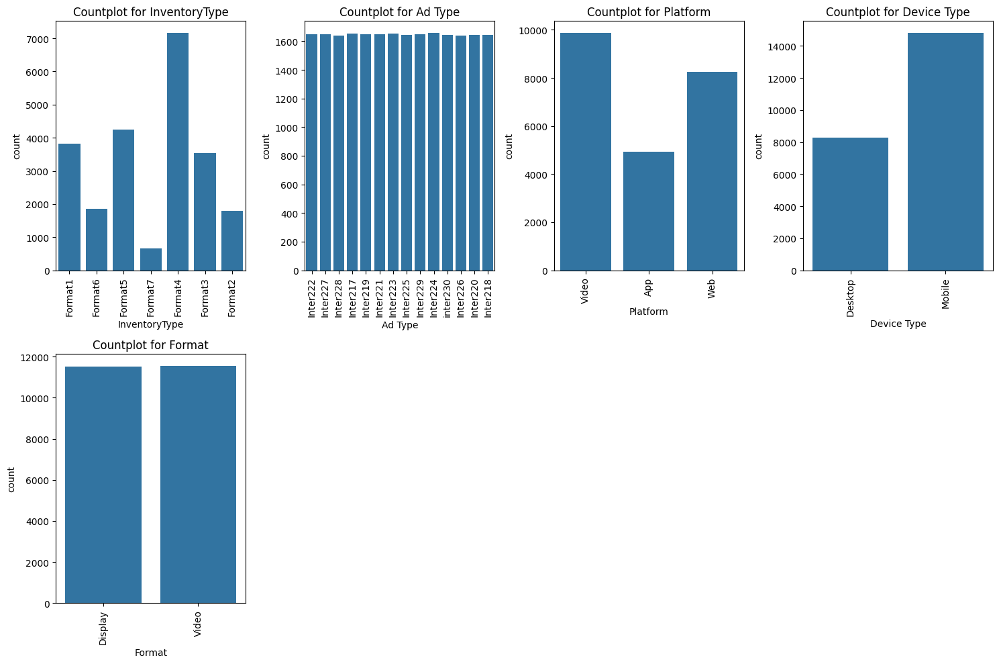

In [252]:
# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 10))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Loop through the selected columns and draw countplots
for i, column in enumerate(cat_columns):
    sns.countplot(x=column, data=data, ax=axes[i])
    axes[i].set_title(f'Countplot for {column}')
    axes[i].tick_params(axis='x', rotation=90)  # Rotate x-axis labels for better readability

# Remove empty subplots
for i in range(len(cat_columns), len(axes)):
    fig.delaxes(axes[i])

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

## Numerical Variables

In [253]:
num_columns = ['Ad - Length', 'Ad- Width', 'Ad Size', 'Available_Impressions','Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue', 'CTR', 'CPM', 'CPC']

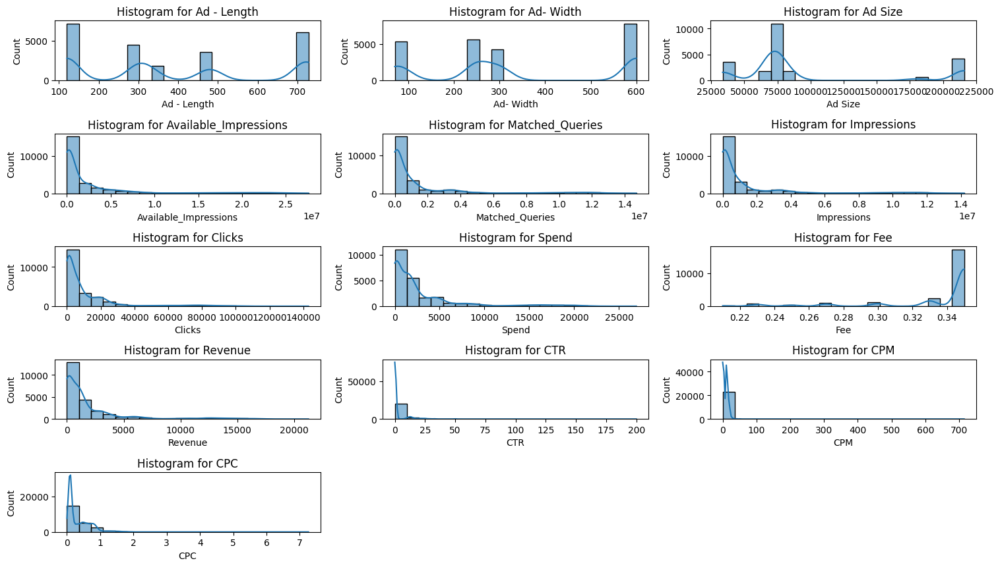

In [296]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up subplots with a maximum of 6 subplots
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 10))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Draw histplot for each numerical column
for i, column in enumerate(num_columns):
    if i < len(axes):
        sns.histplot(data[column], bins=20, kde=True, ax=axes[i])
        axes[i].set_title(f'Histogram for {column}')

# Remove empty subplots
for j in range(len(num_columns), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()


In [259]:
# Calculate and display histogram values for each numerical column
for column in num_columns:
    hist_values, bin_edges = np.histogram(data[column], bins=20)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    print(f'Histogram values for {column}:')
    for center, value in zip(bin_centers, hist_values):
        print(f'Bin Center: {center}, Count: {value}')
    print('\n')

Histogram values for Ad - Length:
Bin Center: 135.2, Count: 7165
Bin Center: 165.60000000000002, Count: 0
Bin Center: 196.0, Count: 0
Bin Center: 226.39999999999998, Count: 0
Bin Center: 256.8, Count: 0
Bin Center: 287.2, Count: 4473
Bin Center: 317.59999999999997, Count: 0
Bin Center: 348.0, Count: 1850
Bin Center: 378.4, Count: 0
Bin Center: 408.79999999999995, Count: 0
Bin Center: 439.2, Count: 0
Bin Center: 469.59999999999997, Count: 3540
Bin Center: 500.0, Count: 0
Bin Center: 530.4, Count: 0
Bin Center: 560.8, Count: 0
Bin Center: 591.2, Count: 0
Bin Center: 621.5999999999999, Count: 0
Bin Center: 652.0, Count: 0
Bin Center: 682.4, Count: 0
Bin Center: 712.8, Count: 6038


Histogram values for Ad- Width:
Bin Center: 83.25, Count: 5329
Bin Center: 109.75, Count: 0
Bin Center: 136.25, Count: 0
Bin Center: 162.75, Count: 0
Bin Center: 189.25, Count: 0
Bin Center: 215.75, Count: 0
Bin Center: 242.25, Count: 5664
Bin Center: 268.75, Count: 0
Bin Center: 295.25, Count: 4249
Bin Center:

In [258]:
# Display numerical summary for each numerical column
for column in num_columns:
    summary = data[column].describe()
    print(f"Summary for {column}:\n{summary}\n")

Summary for Ad - Length:
count    23066.000000
mean       385.163097
std        233.651434
min        120.000000
25%        120.000000
50%        300.000000
75%        720.000000
max        728.000000
Name: Ad - Length, dtype: float64

Summary for Ad- Width:
count    23066.000000
mean       337.896037
std        203.092885
min         70.000000
25%        250.000000
50%        300.000000
75%        600.000000
max        600.000000
Name: Ad- Width, dtype: float64

Summary for Ad Size:
count     23066.000000
mean      96674.468048
std       61538.329557
min       33600.000000
25%       72000.000000
50%       72000.000000
75%       84000.000000
max      216000.000000
Name: Ad Size, dtype: float64

Summary for Available_Impressions:
count    2.306600e+04
mean     2.432044e+06
std      4.742888e+06
min      1.000000e+00
25%      3.367225e+04
50%      4.837710e+05
75%      2.527712e+06
max      2.759286e+07
Name: Available_Impressions, dtype: float64

Summary for Matched_Queries:
count    2.

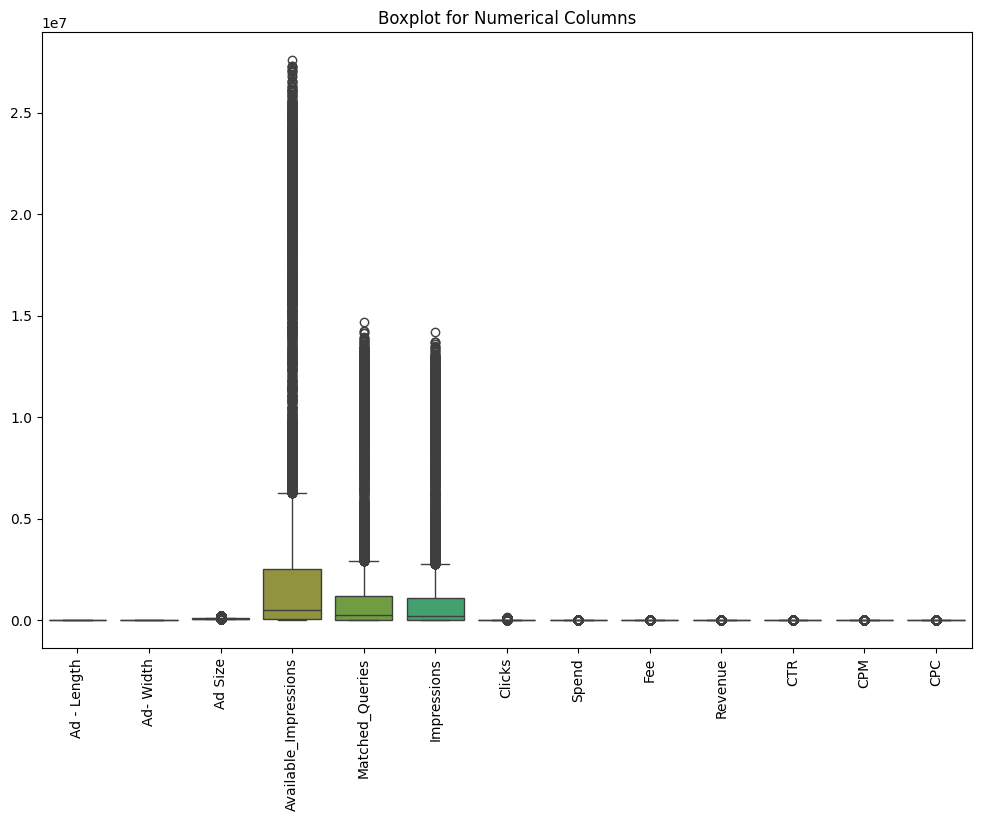

In [255]:
# Set up subplot for boxplot
fig, axes = plt.subplots(figsize=(12, 8))

# Draw boxplot for all numerical columns
sns.boxplot(data=data[num_columns], ax=axes)
axes.set_title('Boxplot for Numerical Columns')
axes.tick_params(axis='x', rotation=90)

# Show the boxplot
plt.show()


In [ ]:
# def remove_outlier(col):
#     col = sorted(col)
#     Q1, Q3 = np.percentile(col, [25, 75])
#     IQR = Q3 - Q1
#     lower_range = Q1 - (1.5 * IQR)
#     upper_range = Q3 + (1.5 * IQR)
#     return lower_range, upper_range

# # List of columns to remove outliers
# columns_to_remove_outliers = ['Ad Size', 'Available_Impressions','Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue', 'CTR', 'CPM', 'CPC']

# # Remove outliers for each specified column
# for column in columns_to_remove_outliers:
#     lr, ur = remove_outlier(data[column])
#     data[column] = np.where(data[column] > ur, ur, data[column])
#     data[column] = np.where(data[column] < lr, lr, data[column])


In [ ]:
# # Set up subplot for boxplot
# fig, axes = plt.subplots(figsize=(12, 8))

# # Draw boxplot for all numerical columns
# sns.boxplot(data=data[num_columns], ax=axes)
# axes.set_title('Boxplot for Numerical Columns after outlier Treatment')
# axes.tick_params(axis='x', rotation=90)

# # Show the boxplot
# plt.show()

In [260]:
data.tail()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,2020-9-13-7,Format5,720,300,216000,Inter220,Web,Mobile,Video,1,1,1,1,0.07,0.35,0.0455,100.0,70.0,0.07
23062,2020-11-2-7,Format5,720,300,216000,Inter224,Web,Desktop,Video,3,2,2,1,0.04,0.35,0.0260,50.0,20.0,0.04
23063,2020-9-14-22,Format5,720,300,216000,Inter218,App,Mobile,Video,2,1,1,1,0.05,0.35,0.0325,100.0,50.0,0.05
23064,2020-11-18-2,Format4,120,600,72000,inter230,Video,Mobile,Video,7,1,1,1,0.07,0.35,0.0455,100.0,70.0,0.07
23065,2020-9-14-0,Format5,720,300,216000,Inter221,App,Mobile,Video,2,2,2,1,0.09,0.35,0.0585,50.0,45.0,0.09


# Bivariate Analysis

## Numeric Vs Numeric

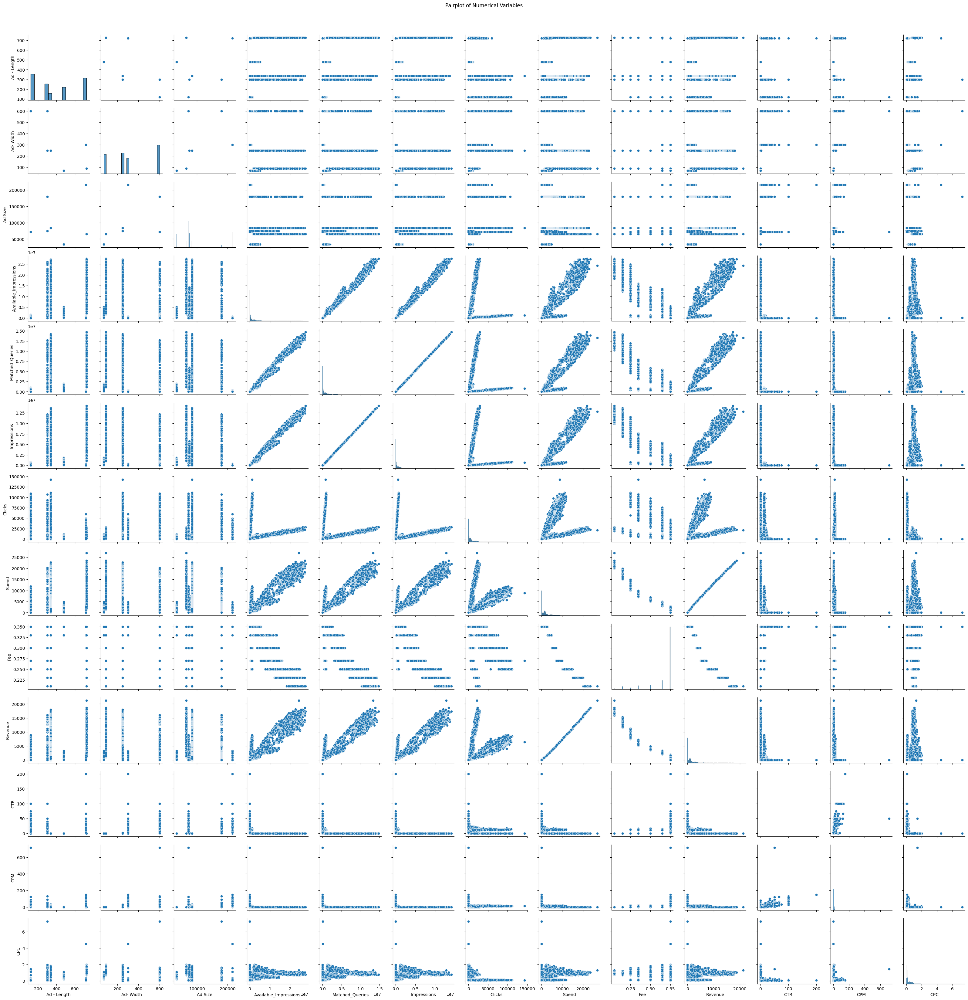

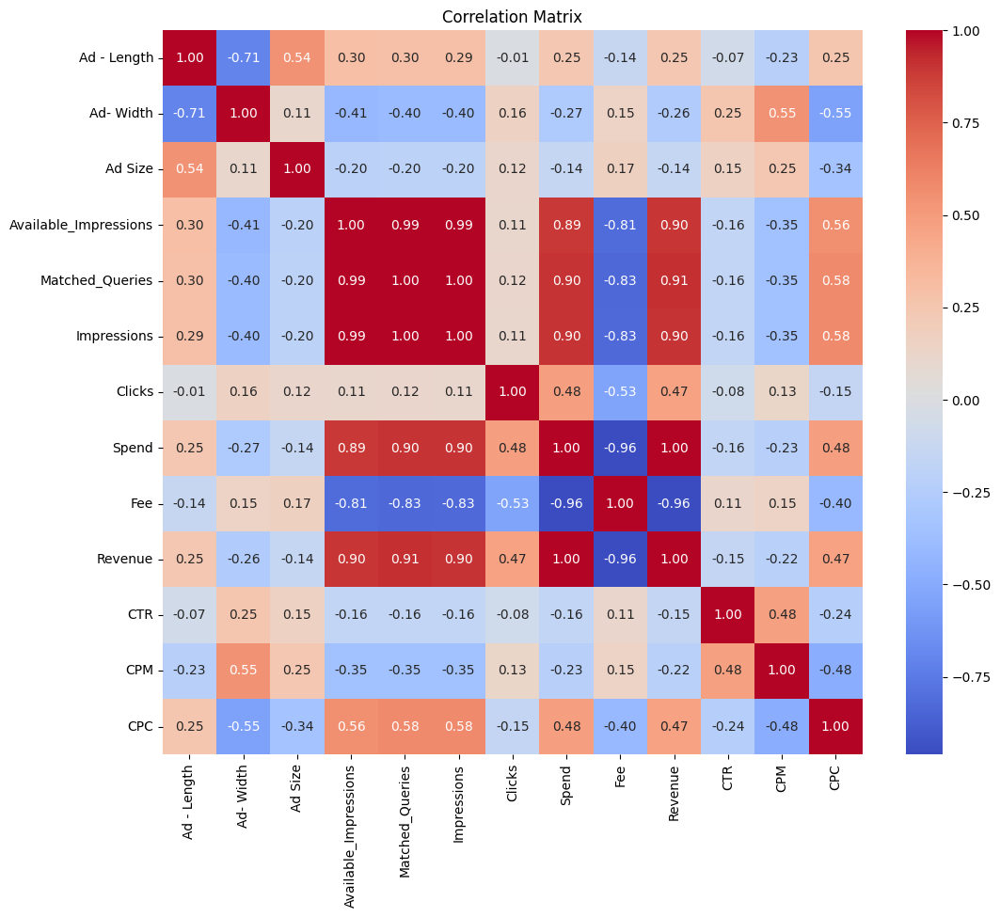

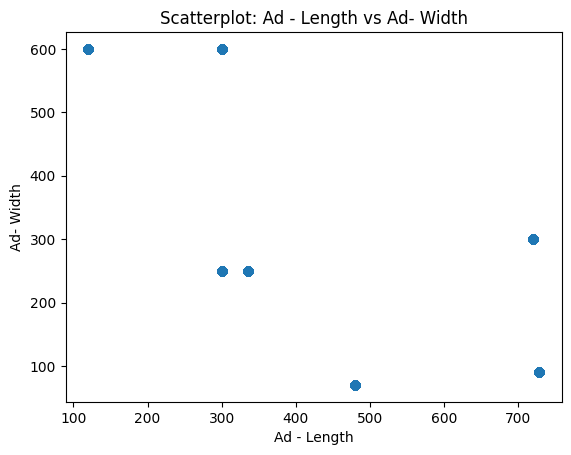

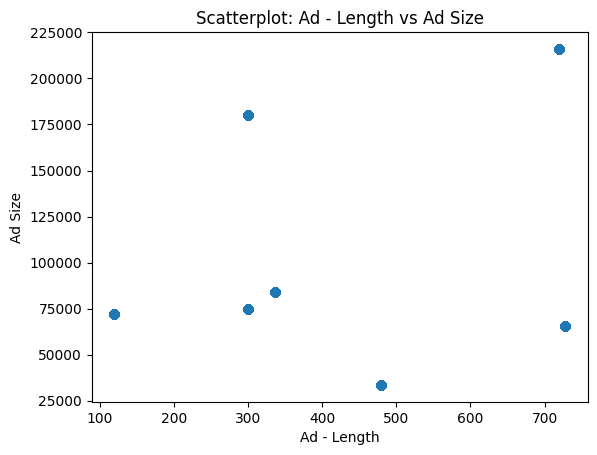

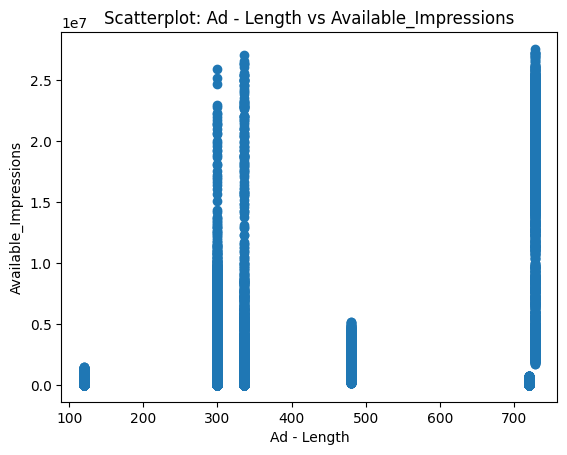

...

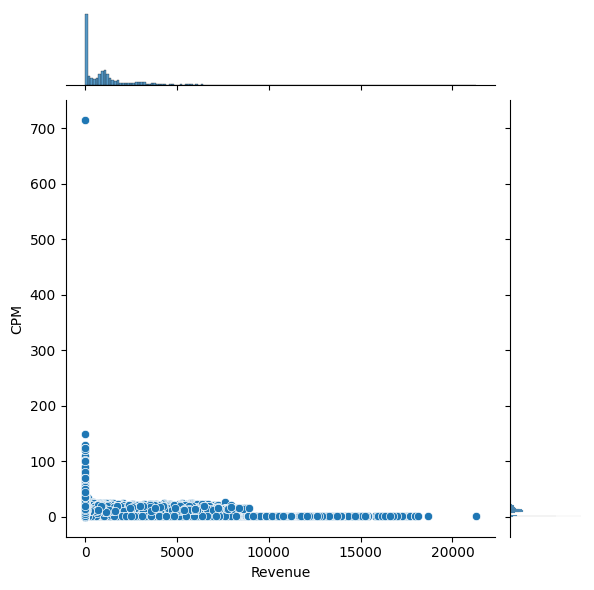

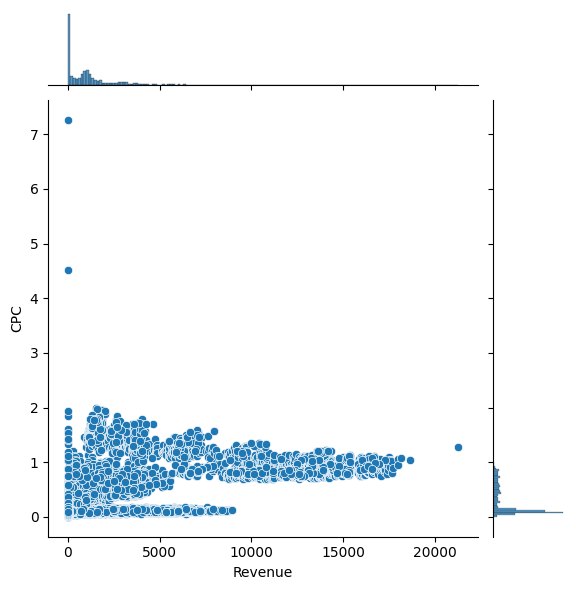

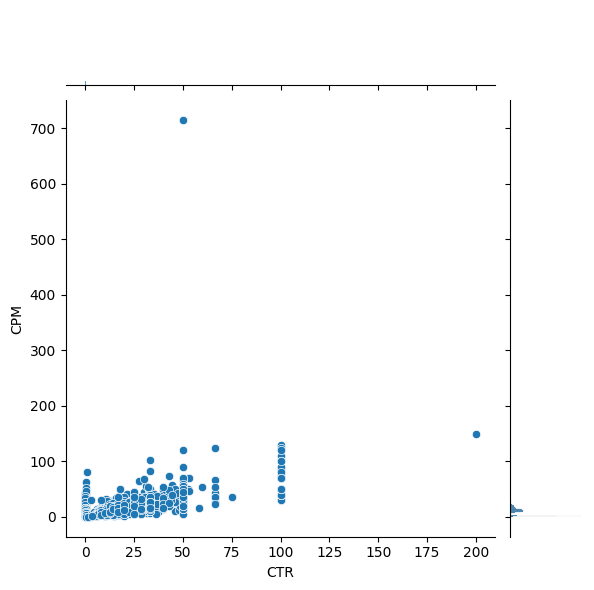

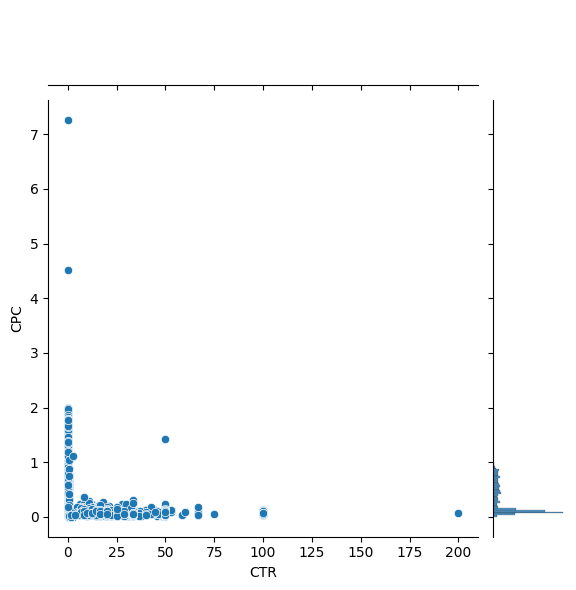

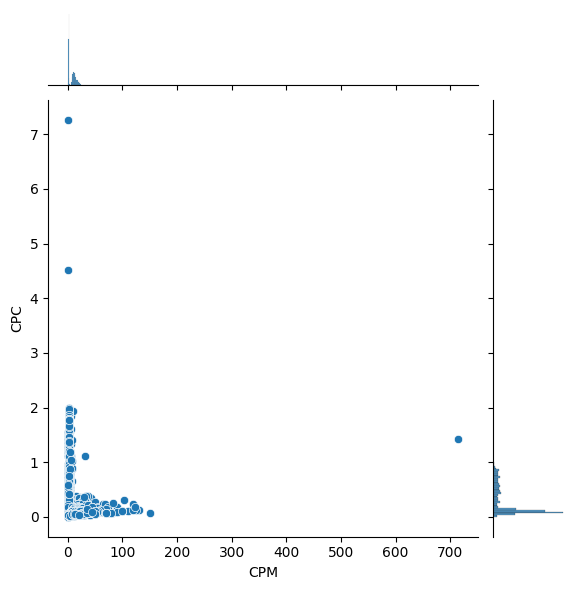

In [257]:
# Pairplot
sns.pairplot(data[num_columns])
plt.suptitle("Pairplot of Numerical Variables", y=1.02)
plt.savefig("pair_NvN.png", format="png", bbox_inches='tight')
plt.show()

# Correlation Matrix
correlation_matrix = data[num_columns].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
#plt.savefig("corr_NvN.png", format="png", bbox_inches='tight')
plt.show()

# Scatterplots
for i in range(len(num_columns)):
    for j in range(i+1, len(num_columns)):
        plt.scatter(data[num_columns[i]], data[num_columns[j]])
        plt.xlabel(num_columns[i])
        plt.ylabel(num_columns[j])
        plt.title(f'Scatterplot: {num_columns[i]} vs {num_columns[j]}')
        #plt.savefig(f"scatter_NvN_{num_columns[i]}_vs_{num_columns[j]}.png", format="png", bbox_inches='tight')
        plt.show()
        

# Jointplots
for i in range(len(num_columns)):
    for j in range(i+1, len(num_columns)):
        sns.jointplot(x=num_columns[i], y=num_columns[j], data=data, kind='scatter')
        fig.suptitle(f'Jointplot: {num_columns[i]} vs {num_columns[j]}', y=1.02)
        #plt.savefig(f"joint_NvN_{num_columns[i]}_vs_{num_columns[j]}.png", format="png", bbox_inches='tight')
        plt.show()
        

In [261]:
# Correlation Matrix
correlation_matrix = data[num_columns].corr()

# Print the clear correlation matrix
print("Clear Correlation Matrix:")
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        column1, column2 = correlation_matrix.columns[i], correlation_matrix.columns[j]
        correlation_coefficient = correlation_matrix.iloc[i, j]
        print(f"{column1} vs {column2}: {correlation_coefficient:.2f}")


Clear Correlation Matrix:
Ad - Length vs Ad- Width: -0.71
Ad - Length vs Ad Size: 0.54
Ad - Length vs Available_Impressions: 0.30
Ad - Length vs Matched_Queries: 0.30
Ad - Length vs Impressions: 0.29
Ad - Length vs Clicks: -0.01
Ad - Length vs Spend: 0.25
Ad - Length vs Fee: -0.14
Ad - Length vs Revenue: 0.25
Ad - Length vs CTR: -0.07
Ad - Length vs CPM: -0.23
Ad - Length vs CPC: 0.25
Ad- Width vs Ad Size: 0.11
Ad- Width vs Available_Impressions: -0.41
Ad- Width vs Matched_Queries: -0.40
Ad- Width vs Impressions: -0.40
Ad- Width vs Clicks: 0.16
Ad- Width vs Spend: -0.27
Ad- Width vs Fee: 0.15
Ad- Width vs Revenue: -0.26
Ad- Width vs CTR: 0.25
Ad- Width vs CPM: 0.55
Ad- Width vs CPC: -0.55
Ad Size vs Available_Impressions: -0.20
Ad Size vs Matched_Queries: -0.20
Ad Size vs Impressions: -0.20
Ad Size vs Clicks: 0.12
Ad Size vs Spend: -0.14
Ad Size vs Fee: 0.17
Ad Size vs Revenue: -0.14
Ad Size vs CTR: 0.15
Ad Size vs CPM: 0.25
Ad Size vs CPC: -0.34
Available_Impressions vs Matched_Querie

## categorical vs numerical variables

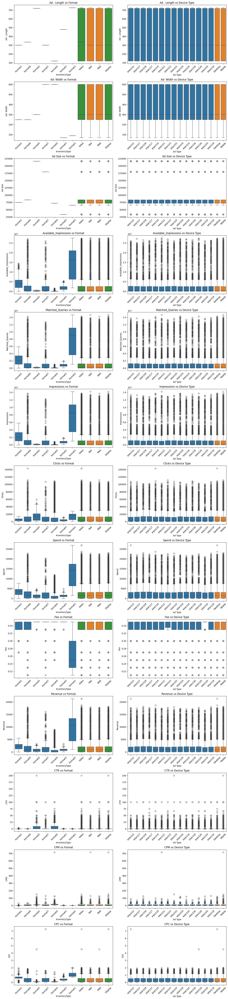

In [262]:
fig, axes = plt.subplots(nrows=len(num_columns), ncols=2, figsize=(15, 5 * len(num_columns)))

# Counter for the row index in subplots
row_idx = 0

# Iterate through numerical and categorical columns for boxplots
for i, num_col in enumerate(num_columns):
    for j, cat_col in enumerate(cat_columns):
        # Create boxplot for the current combination
        sns.boxplot(x=cat_col, y=num_col, data=data, ax=axes[i, j % 2])
        axes[i, j % 2].set_title(f'{num_col} vs {cat_col}')
        axes[i, j % 2].tick_params(axis='x', rotation=45)  # Rotate x-axis labels

# Adjust layout
plt.tight_layout()
plt.show()


In [300]:
# Iterate through numerical and categorical columns for statistical values
for num_col in num_columns:
    for cat_col in cat_columns:
        # Extract statistical values for the current combination
        stats = data.groupby(cat_col)[num_col].describe()
        
        # Print the statistics
        print(f"\nStatistics for {num_col} vs {cat_col}:\n{stats}")



Statistics for Ad - Length vs InventoryType:
                count   mean  std    min    25%    50%    75%    max
InventoryType                                                       
Format1        3814.0  300.0  0.0  300.0  300.0  300.0  300.0  300.0
Format2        1789.0  728.0  0.0  728.0  728.0  728.0  728.0  728.0
Format3        3540.0  480.0  0.0  480.0  480.0  480.0  480.0  480.0
Format4        7165.0  120.0  0.0  120.0  120.0  120.0  120.0  120.0
Format5        4249.0  720.0  0.0  720.0  720.0  720.0  720.0  720.0
Format6        1850.0  336.0  0.0  336.0  336.0  336.0  336.0  336.0
Format7         659.0  300.0  0.0  300.0  300.0  300.0  300.0  300.0

Statistics for Ad - Length vs Ad Type:
           count        mean         std    min    25%    50%    75%    max
Ad Type                                                                    
Inter217  1655.0  385.645921  233.529313  120.0  120.0  300.0  720.0  728.0
Inter218  1645.0  385.317933  233.717392  120.0  120.0  300.0  72

In [263]:
def remove_outlier(col):
    col = sorted(col)
    Q1, Q3 = np.percentile(col, [25, 75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range

# List of columns to remove outliers
columns_to_remove_outliers = ['Ad Size', 'Available_Impressions','Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue', 'CTR', 'CPM', 'CPC']

# Remove outliers for each specified column
for column in columns_to_remove_outliers:
    lr, ur = remove_outlier(data[column])
    data[column] = np.where(data[column] > ur, ur, data[column])
    data[column] = np.where(data[column] < lr, lr, data[column])


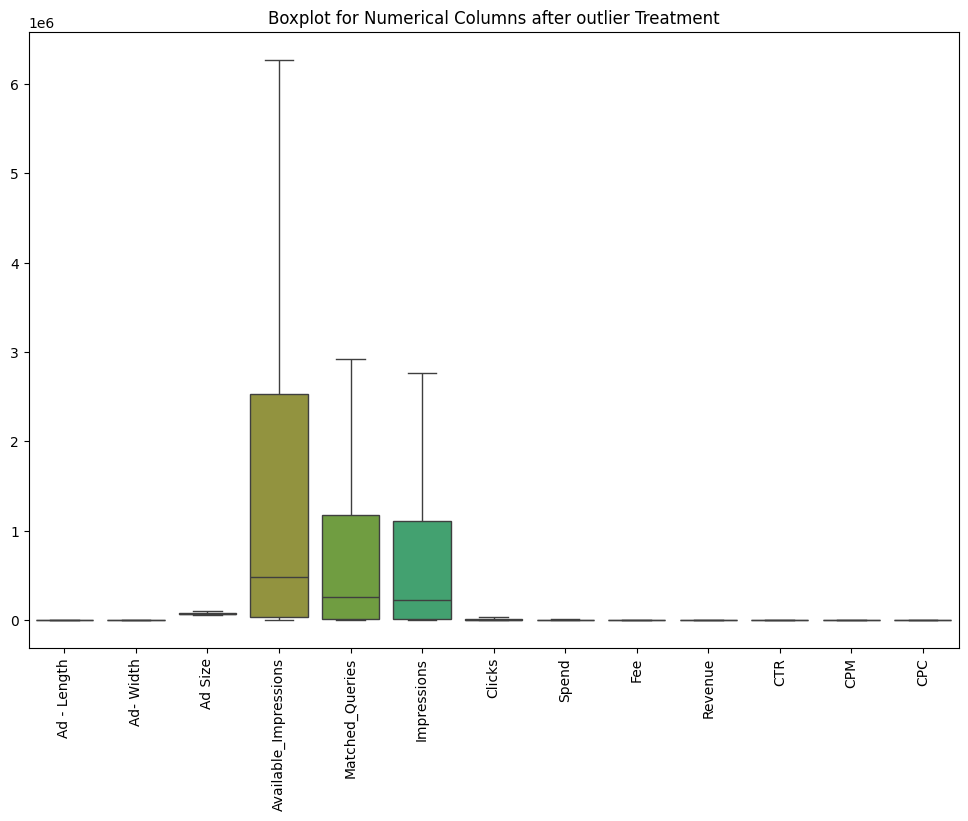

In [264]:
# Set up subplot for boxplot
fig, axes = plt.subplots(figsize=(12, 8))

# Draw boxplot for all numerical columns
sns.boxplot(data=data[num_columns], ax=axes)
axes.set_title('Boxplot for Numerical Columns after outlier Treatment')
axes.tick_params(axis='x', rotation=90)

# Show the boxplot
plt.show()

In [286]:
data.tail()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,Cluster
23061,2020-9-13-7,Format5,720,300,102000.0,Inter220,Web,Mobile,Video,1.0,1.0,1.0,1.0,0.07,0.35,0.0455,0.454344,29.975,0.07,0
23062,2020-11-2-7,Format5,720,300,102000.0,Inter224,Web,Desktop,Video,3.0,2.0,2.0,1.0,0.04,0.35,0.0260,0.454344,20.000,0.04,0
23063,2020-9-14-22,Format5,720,300,102000.0,Inter218,App,Mobile,Video,2.0,1.0,1.0,1.0,0.05,0.35,0.0325,0.454344,29.975,0.05,0
23064,2020-11-18-2,Format4,120,600,72000.0,inter230,Video,Mobile,Video,7.0,1.0,1.0,1.0,0.07,0.35,0.0455,0.454344,29.975,0.07,2
23065,2020-9-14-0,Format5,720,300,102000.0,Inter221,App,Mobile,Video,2.0,2.0,2.0,1.0,0.09,0.35,0.0585,0.454344,29.975,0.09,0


In [ ]:
# 33.278766 ctr

## Z-score

In [265]:
num_columns_zscored = data[num_columns].apply(zscore)

# Display the resulting DataFrame with z-score normalized values
num_columns_zscored.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,-0.364496,-0.432797,-0.102518,-0.755333,-0.778949,-0.768478,-0.867488,-0.89317,0.535724,-0.880093,-0.891201,-1.194562,-1.04114
1,-0.364496,-0.432797,-0.102518,-0.755345,-0.778988,-0.768516,-0.867488,-0.89317,0.535724,-0.880093,-0.888615,-1.194562,-1.04114
2,-0.364496,-0.432797,-0.102518,-0.754900,-0.778919,-0.768445,-0.867488,-0.89317,0.535724,-0.880093,-0.893142,-1.194562,-1.04114
3,-0.364496,-0.432797,-0.102518,-0.755040,-0.778781,-0.768302,-0.867488,-0.89317,0.535724,-0.880093,-0.898315,-1.194562,-1.04114
4,-0.364496,-0.432797,-0.102518,-0.755610,-0.779030,-0.768560,-0.867488,-0.89317,0.535724,-0.880093,-0.884734,-1.194562,-1.04114


In [266]:
num_columns_zscored.tail()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,1.433093,-0.186599,1.652896,-0.756182,-0.779265,-0.768806,-0.867488,-0.893141,0.535724,-0.880066,2.027108,3.162016,-0.820450
23062,1.433093,-0.186599,1.652896,-0.756181,-0.779264,-0.768805,-0.867488,-0.893154,0.535724,-0.880078,2.027108,1.712246,-0.915032
23063,1.433093,-0.186599,1.652896,-0.756182,-0.779265,-0.768806,-0.867488,-0.893150,0.535724,-0.880074,2.027108,3.162016,-0.883504
23064,-1.134891,1.290590,-0.297564,-0.756179,-0.779265,-0.768806,-0.867488,-0.893141,0.535724,-0.880066,2.027108,3.162016,-0.820450
23065,1.433093,-0.186599,1.652896,-0.756182,-0.779264,-0.768805,-0.867488,-0.893133,0.535724,-0.880058,2.027108,3.162016,-0.757396


## AgglomerativeClustering

In [267]:
from sklearn.cluster import AgglomerativeClustering

model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
model.fit(num_columns_zscored)
labels = model.labels_
display(labels)

array([2, 2, 2, ..., 4, 2, 4], dtype=int64)

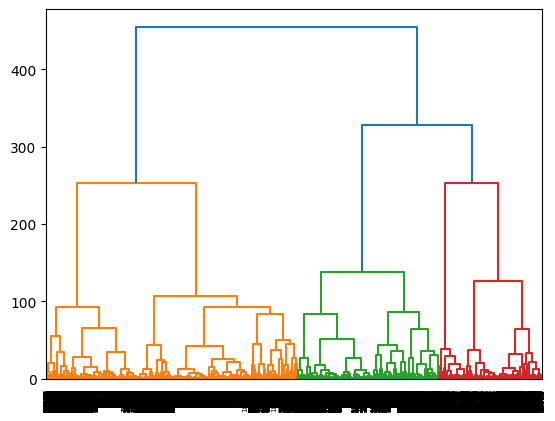

In [268]:
from scipy.cluster.hierarchy import dendrogram, linkage
wardlink = linkage(num_columns_zscored, method = 'ward', metric='euclidean')
dend = dendrogram(wardlink)

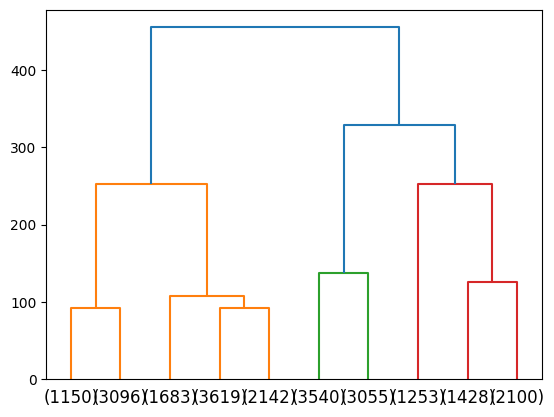

In [269]:
dend = dendrogram(wardlink,
                 truncate_mode='lastp',
                 p = 10,
                 )

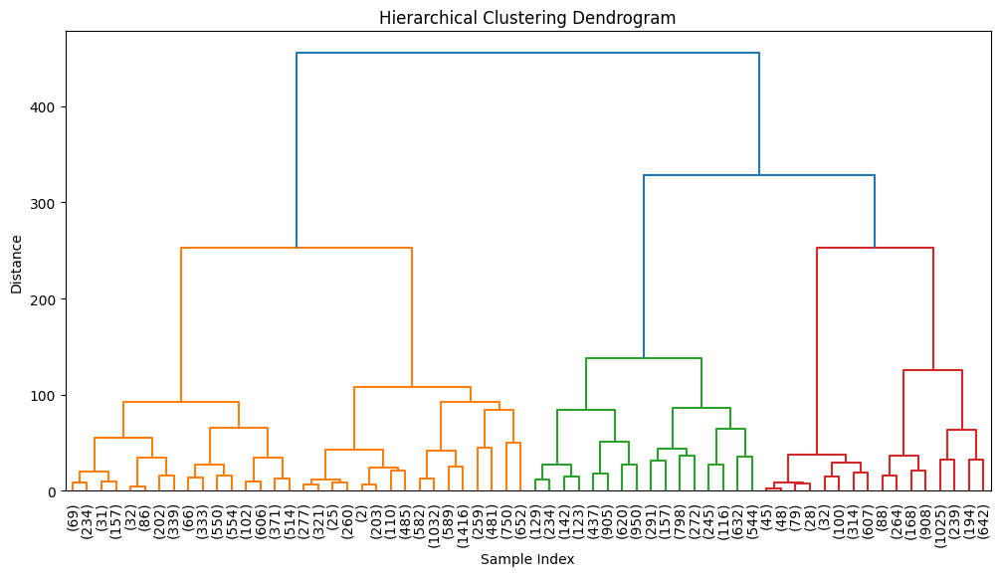

In [270]:
from scipy.cluster.hierarchy import dendrogram, linkage
# Calculate the linkage matrix using Ward linkage and Euclidean distance
linkage_matrix = linkage(num_columns_zscored, 'ward')

# Construct and plot the dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, p=5, truncate_mode='level', orientation='top', leaf_font_size=10)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()


# K-means

Inertia for 2 clusters: 187902.65722864718
Inertia for 3 clusters: 139992.98099478846
Inertia for 4 clusters: 105294.12804593373
Inertia for 5 clusters: 72133.68402187488
Inertia for 6 clusters: 62259.98939794776
Inertia for 7 clusters: 55151.52147681745
Inertia for 8 clusters: 49712.88198467381
Inertia for 9 clusters: 44876.096593928625
Inertia for 10 clusters: 41213.25557945479


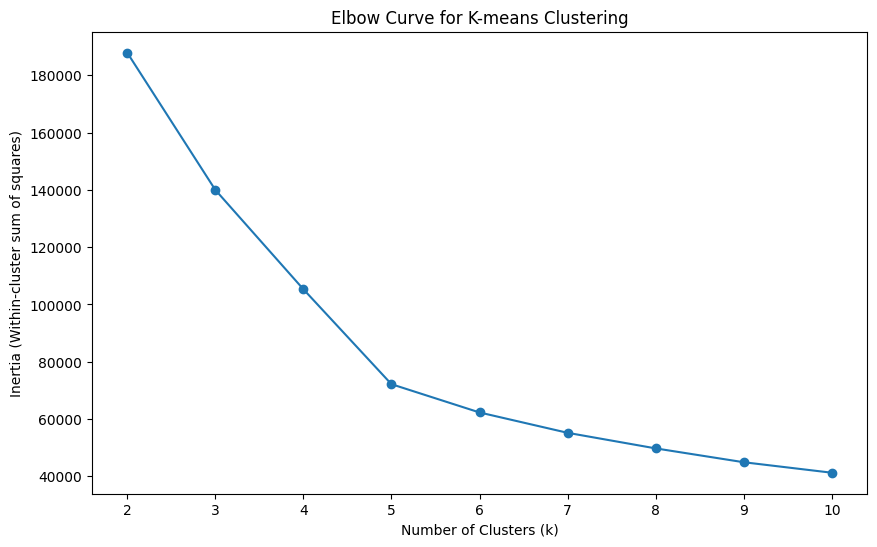

Best number of clusters (based on silhouette score): 5


In [271]:
k_values = range(2, 11)
inertia_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(num_columns_zscored)
    inertia_values.append(kmeans.inertia_)
    print(f"Inertia for {k} clusters: {kmeans.inertia_}")

# Step 2: Plot the Elbow Curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Curve for K-means Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (Within-cluster sum of squares)')
plt.show()

# Step 3: Check Silhouette Scores
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(num_columns_zscored)
    silhouette_avg = silhouette_score(num_columns_zscored, labels)
    silhouette_scores.append(silhouette_avg)

# Step 4: Figure out the Appropriate Number of Clusters
best_k = k_values[np.argmax(silhouette_scores)]
print(f"Best number of clusters (based on silhouette score): {best_k}")



In [ ]:
# personal notes: 62466 inertia 6 

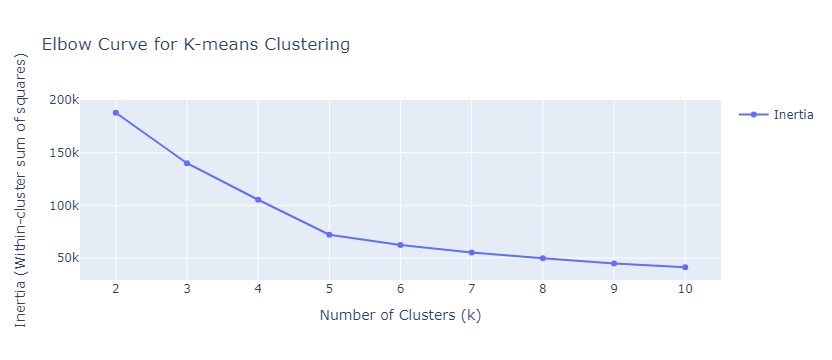

In [272]:
# Step 2: Plot the Elbow Curve using Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(k_values), y=inertia_values, mode='lines+markers', name='Inertia'))
fig.update_layout(title='Elbow Curve for K-means Clustering',
                  xaxis=dict(title='Number of Clusters (k)',tickformat='d'),
                  yaxis=dict(title='Inertia (Within-cluster sum of squares)'),
                  showlegend=True)

# Display the figure
fig.show()


In [273]:
# Print Silhouette Scores
for k, silhouette_coefficient in zip(k_values, silhouette_scores):
    print("For number of clusters={}, The Silhouette Score is {:.5f}".format(k, silhouette_coefficient))

For number of clusters=2, The Silhouette Score is 0.40304
For number of clusters=3, The Silhouette Score is 0.34549
For number of clusters=4, The Silhouette Score is 0.40329
For number of clusters=5, The Silhouette Score is 0.48021
For number of clusters=6, The Silhouette Score is 0.47614
For number of clusters=7, The Silhouette Score is 0.46883
For number of clusters=8, The Silhouette Score is 0.43234
For number of clusters=9, The Silhouette Score is 0.41416
For number of clusters=10, The Silhouette Score is 0.42907


In [274]:
from sklearn.metrics import silhouette_samples

# Step 3: Check Silhouette Scores
silhouette_scores = []
silhouette_samples_list = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(num_columns_zscored)
    
    silhouette_avg = silhouette_score(num_columns_zscored, labels)
    silhouette_scores.append(silhouette_avg)
    
    # Calculate silhouette samples
    samples = silhouette_samples(num_columns_zscored, labels)
    silhouette_samples_list.append(samples)

# Step 4: Figure out the Appropriate Number of Clusters
best_k = k_values[np.argmax(silhouette_scores)]
print(f"Best number of clusters (based on silhouette score): {best_k}")

# Additional Step: Print Silhouette Samples for each data point
for k, samples in zip(k_values, silhouette_samples_list):
    print(f"Silhouette samples for {k} clusters:")
    print(samples)
    print("="*50)


Best number of clusters (based on silhouette score): 5
Silhouette samples for 2 clusters:
[0.48682918 0.48692837 0.48675004 ... 0.40665247 0.43120935 0.40607941]
Silhouette samples for 3 clusters:
[0.12543759 0.12527048 0.12559078 ... 0.32435262 0.36821414 0.32177803]
Silhouette samples for 4 clusters:
[0.11330889 0.1131331  0.1134691  ... 0.33243035 0.37335009 0.32990228]
Silhouette samples for 5 clusters:
[0.04771483 0.04747438 0.04792687 ... 0.16414163 0.41081529 0.16433183]
Silhouette samples for 6 clusters:
[0.06640826 0.0661767  0.06661304 ... 0.16300183 0.41020672 0.16319058]
Silhouette samples for 7 clusters:
[0.1161033  0.11590575 0.11628224 ... 0.165281   0.41429875 0.16549402]
Silhouette samples for 8 clusters:
[0.06469393 0.06486488 0.06452891 ... 0.0937664  0.36269857 0.09413513]
Silhouette samples for 9 clusters:
[0.06423738 0.064408   0.0640726  ... 0.29637067 0.36331643 0.2974641 ]
Silhouette samples for 10 clusters:
[-0.00547586 -0.00520188 -0.00572458 ...  0.29283758 

In [279]:
k_means = KMeans(n_clusters = 5,n_init=10)
k_means.fit(num_columns_zscored)
labels = k_means.labels_

x=silhouette_score(num_columns_zscored,labels)
x

sil_width = silhouette_samples(num_columns_zscored,labels)
sil_width

silhouette_samples(num_columns_zscored,labels).min()

-0.039824648781213216

In [284]:
# Step 5: Cluster Profiling
# Fit K-means with the best number of clusters
best_kmeans = KMeans(n_clusters=best_k, random_state=42)
best_labels = best_kmeans.fit_predict(num_columns_zscored)

# Add cluster labels to the original DataFrame
num_columns_zscored['Cluster'] = best_labels
data['Cluster'] = best_labels

In [281]:
# Make a copy of 'num_columns_zscored'
#num_columns_zscored_devicetype = num_columns_zscored.copy()

# Add 'Device Type' column from 'data' to the copied DataFrame
#num_columns_zscored_devicetype['Device Type'] = data['Device Type']

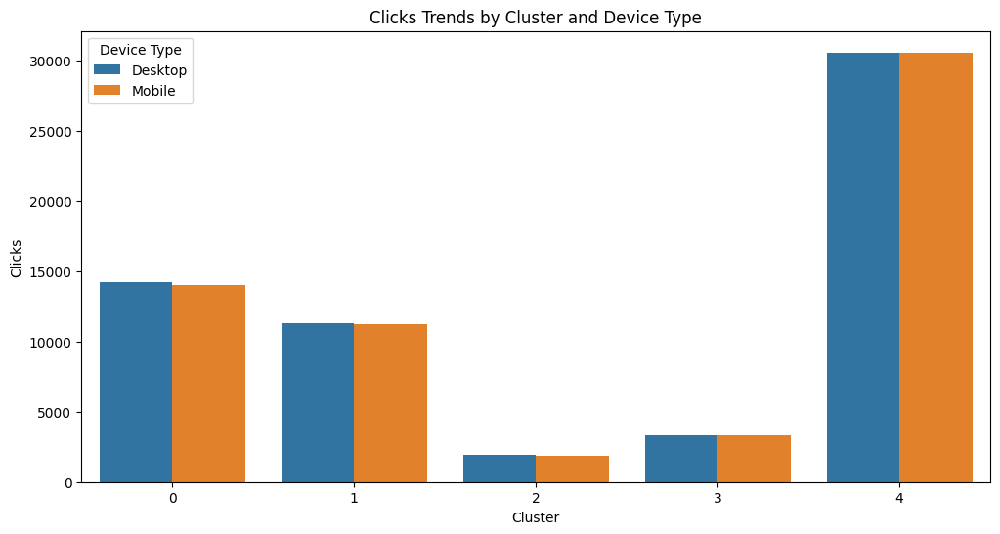

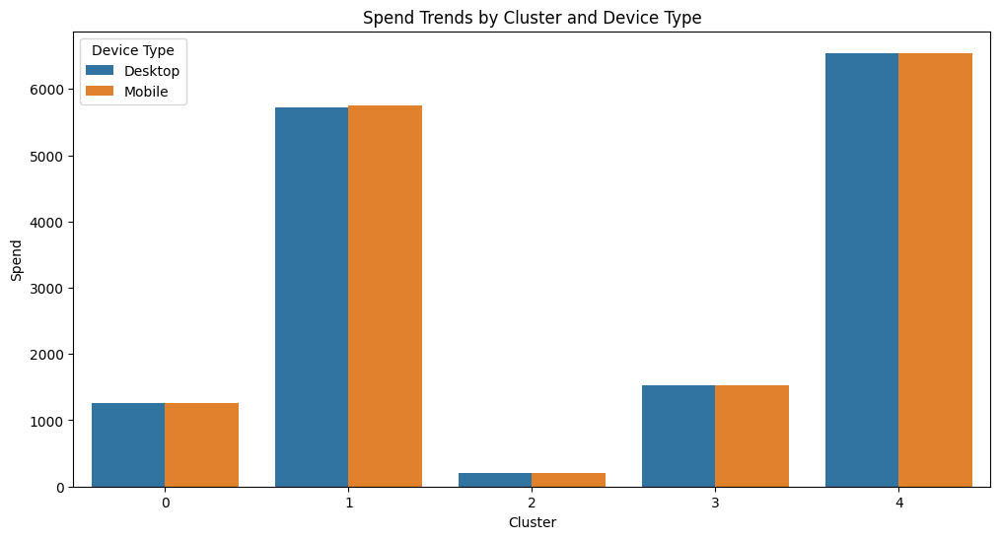

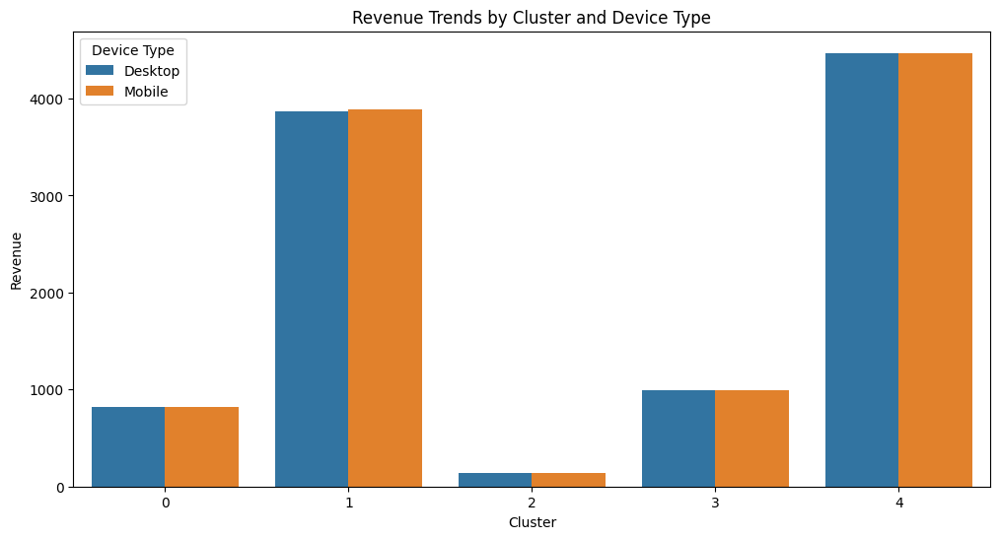

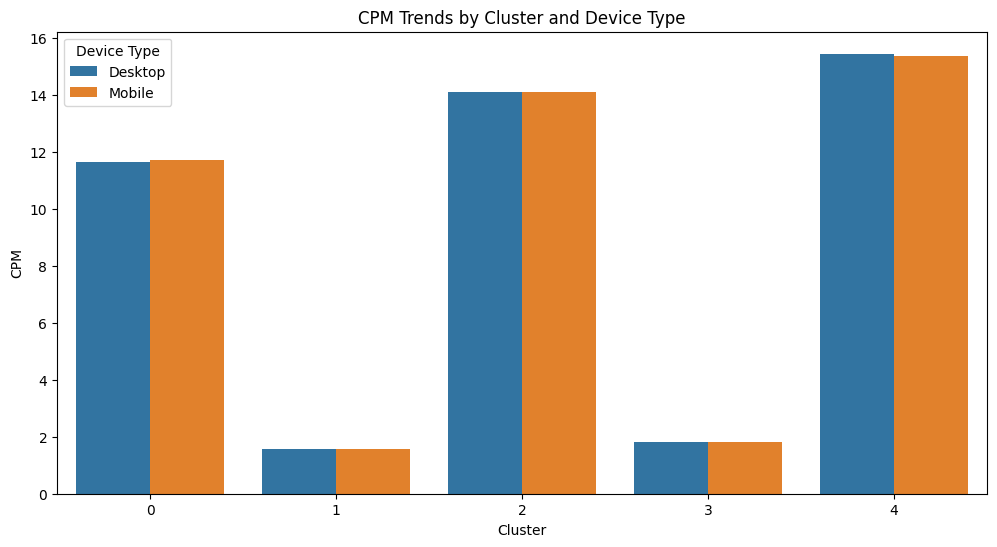

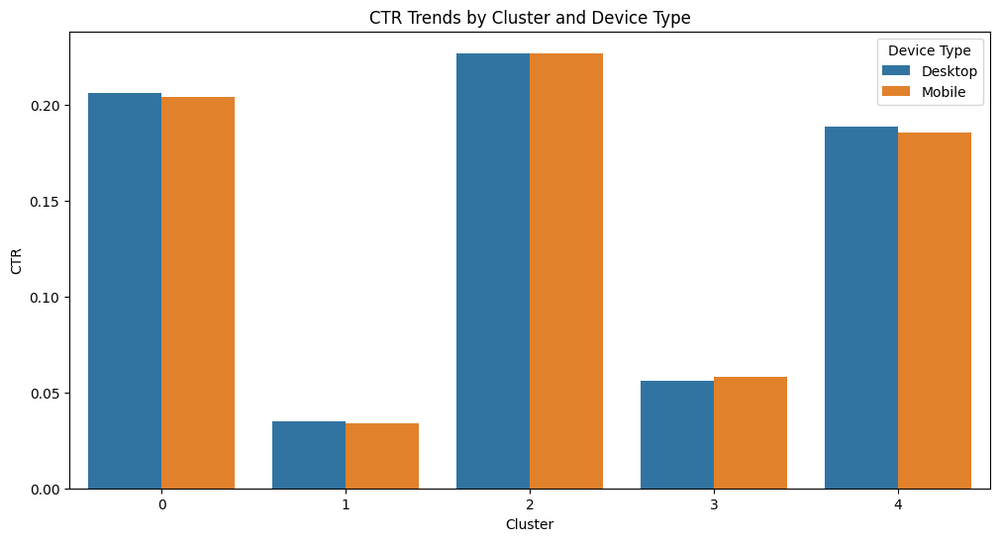

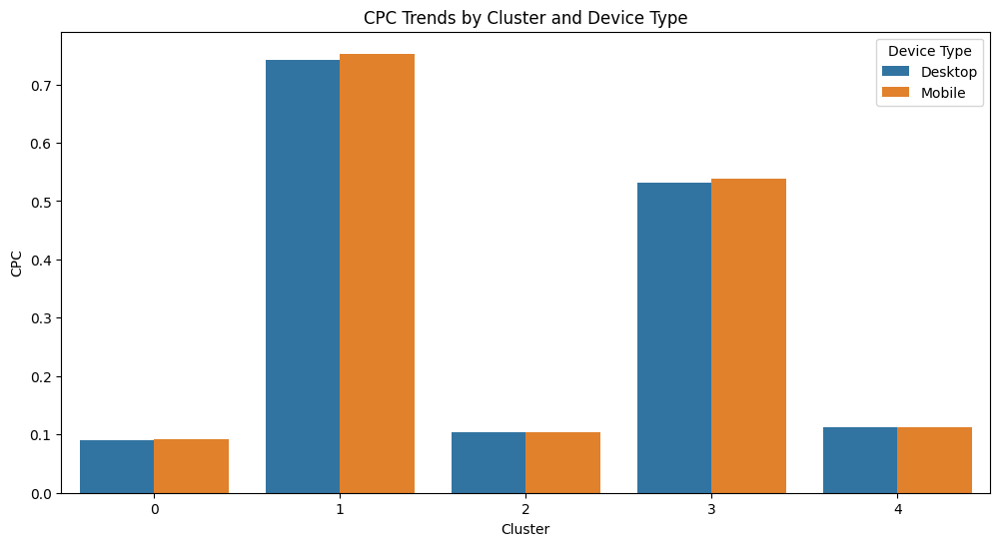

In [285]:
# Group by clusters and calculate mean for each cluster
#cluster_means = num_columns_zscored_devicetype.groupby(['Cluster', 'Device Type']).agg({'Clicks':'mean', 'Spend':'mean', 'Revenue':'mean', 'CPM':'mean', 'CTR':'mean', 'CPC':'mean'}).reset_index()

cluster_means = data.groupby(['Cluster', 'Device Type']).agg({'Clicks':'mean', 'Spend':'mean', 'Revenue':'mean', 'CPM':'mean', 'CTR':'mean', 'CPC':'mean'}).reset_index()
# Visualize trends using bar plots
columns_to_profile = ['Clicks', 'Spend', 'Revenue', 'CPM', 'CTR', 'CPC']

for column in columns_to_profile:
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Cluster', y=column, hue='Device Type', data=cluster_means)
    plt.title(f'{column} Trends by Cluster and Device Type')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.show()

In [287]:
cluster_means

,Cluster,Device Type,Clicks,Spend,Revenue,CPM,CTR,CPC
0,0,Desktop,14246.929529,1253.277342,816.130957,11.623212,0.206214,0.090368
1,0,Mobile,13995.734810,1254.604964,817.047068,11.712394,0.204429,0.091380
2,1,Desktop,11327.692886,5721.237688,3867.488556,1.560723,0.034836,0.742827
3,1,Mobile,11212.350599,5753.942779,3888.141729,1.579737,0.033795,0.752804
4,2,Desktop,1918.356003,208.883552,135.799904,14.096024,0.227052,0.104181
5,2,Mobile,1871.743072,210.706956,136.988601,14.088369,0.227079,0.104510
6,3,Desktop,3311.025688,1522.011083,991.712318,1.810714,0.056259,0.532130
7,3,Mobile,3300.750758,1525.168783,993.856299,1.802928,0.058160,0.538037
8,4,Desktop,30585.949821,6538.350806,4464.868047,15.440287,0.188667,0.111979
9,4,Mobile,30549.458970,6544.070591,4470.930663,15.361408,0.185848,0.111910


In [350]:
for column in columns_to_profile:
    print(f"{column} Trends by Cluster and Device Type:")
    for cluster in cluster_means['Cluster'].unique():
        for device_type in cluster_means['Device Type'].unique():
            value = cluster_means.loc[(cluster_means['Cluster'] == cluster) & (cluster_means['Device Type'] == device_type), column].values[0]
            print(f"Cluster {cluster}, Device Type {device_type}: {value}")
    print()


Clicks Trends by Cluster and Device Type:
Cluster 0, Device Type Desktop: 14246.92952920143
Cluster 0, Device Type Mobile: 13995.734809602649
Cluster 1, Device Type Desktop: 11327.692886456909
Cluster 1, Device Type Mobile: 11212.350599149595
Cluster 2, Device Type Desktop: 1918.3560033585222
Cluster 2, Device Type Mobile: 1871.7430718647252
Cluster 3, Device Type Desktop: 3311.0256880733946
Cluster 3, Device Type Mobile: 3300.7507575757577
Cluster 4, Device Type Desktop: 30585.94982078853
Cluster 4, Device Type Mobile: 30549.45897043833

Spend Trends by Cluster and Device Type:
Cluster 0, Device Type Desktop: 1253.2773420738974
Cluster 0, Device Type Mobile: 1254.604963576159
Cluster 1, Device Type Desktop: 5721.237688098495
Cluster 1, Device Type Mobile: 5753.94277928102
Cluster 2, Device Type Desktop: 208.8835516372796
Cluster 2, Device Type Mobile: 210.70695631751997
Cluster 3, Device Type Desktop: 1522.0110825688073
Cluster 3, Device Type Mobile: 1525.1687828282827
Cluster 4, Devi